# Object Detection using Tensorflow Object Detection API and EfficientDet

*Note: This notebook has been made in a way to allow you to train other projects as well; you only need images and annotations put in a zip file named data.zip, then you upload it on Google Drive at the root.*

For this project I used the dataset <a href='https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset'>Stanford Dogs</a> from kaggle.

## Dependencies Installation

1. Connect Colab to your Google Drive
2. Clone Tensorflow Object Detection API
3. Install ProtocolBuffer
4. (Get the right version of openCV)
5. Test Tensorflow Object Detection API

In [52]:
from google.colab import drive

drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [53]:
!git clone --q https://github.com/tensorflow/models.git

In [54]:
%cd models/research
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/models/research
Processing /content/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 10.2 MB 11.5 MB/s 
     |████████████████████████████████| 352 kB 70.9 MB/s 
     |████████████████████████████████| 2.2 MB 38.8 MB/s 
     |████████████████████████████████| 23.4 MB 40.9 MB/s 
     |████████████████████████████████| 43 kB 2.0 MB/s 
     |████████████████████████████████| 1.1 MB 49.5 MB/s 
     |████████████████████████████████| 237 kB 60.3 MB/s 
     |████████████████████████████████| 99 kB 10.0 MB/s 
     |████████████████████████████████| 47.8 MB 48 kB/s 
     |█████████████████

In [55]:
!pip uninstall opencv-python-headless
!pip install opencv-python-headless==4.1.2.30

Found existing installation: opencv-python-headless 4.5.5.64
Uninstalling opencv-python-headless-4.5.5.64:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.5.5.64.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-65fa80df.so.58.134.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-8ef5c7db.so.58.76.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavutil-9c768859.so.56.70.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libbz2-a273e504.so.1.0.6
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libcrypto-09fe7800.so.1.1
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libgfortran-91cc3cb1.so.3.0.0
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libopenblas-r0-f650aae0.3.3.so
    /usr/local/lib/python3.7/dis

In [ ]:
!python object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2022-05-13 09:54:21.089195: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0513 09:54:21.556606 140276627146624 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 6.0s
I0513 09:54:22.261023 140276627146624 test_util.py:2374] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 6.0s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 1.0s
I0513 09:54:23.261125 140276627146624 test_ut

## Data preparation

Before running this code you need to upload to Google Drive your images and annotations in a zip file named data.zip, don't bother making a training and test folder, the program will automatically split the data.

0. Make directories (customModel/Data)
1. Download generate_tfrecord.py from GitHub
2. Unzip images and annotations
3. Split the data into training and testing
4. Generate labelmap.pbtxt from annotations
5. Generate tf_records
6. Download the desired model
7. Modify the configuration file

In [ ]:
%cd /content/gdrive/MyDrive/

import os

if(not os.path.exists(os.getcwd()+'/customModel')):
  os.mkdir(os.getcwd()+'/customModel')
  if(not os.path.exists(os.getcwd()+'/customModel/annotations')):
    os.mkdir(os.getcwd()+'/customModel/annotations')
  if(not os.path.exists(os.getcwd()+'/customModel/training')):
    os.mkdir(os.getcwd()+'/customModel/training')
  if(not os.path.exists(os.getcwd()+'/customModel/data')):
    os.mkdir(os.getcwd()+'/customModel/data')
    if(not os.path.exists(os.getcwd()+'/customModel/data/train')):
      os.mkdir(os.getcwd()+'/customModel/data/train')
    if(not os.path.exists(os.getcwd()+'/customModel/data/test')):
      os.mkdir(os.getcwd()+'/customModel/data/test')

/content/gdrive/MyDrive


In [ ]:
%cd /content/gdrive/MyDrive/customModel/

!wget https://raw.githubusercontent.com/Serenalyw/Object_Detection/master/generate_tfrecord.py

/content/gdrive/MyDrive/customModel
--2022-05-11 12:03:52--  https://raw.githubusercontent.com/Serenalyw/Object_Detection/master/generate_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6563 (6.4K) [text/plain]
Saving to: ‘generate_tfrecord.py’

generate_tfrecord.p 100%[===================>]   6.41K  --.-KB/s    in 0.001s  

2022-05-11 12:03:52 (4.78 MB/s) - ‘generate_tfrecord.py’ saved [6563/6563]



In [ ]:
%cd /content/gdrive/MyDrive/customModel/data/

!unzip /content/gdrive/MyDrive/data.zip -d .

In [ ]:
%cd /content/gdrive/MyDrive/customModel/data/

from xml.dom import minidom
import pandas as pd
import numpy as np
import random
import shutil

SplitPercentage = 0.15

listClass = []
nbrClass = []
listRow = []

df = pd.DataFrame(columns=['fileName', 'class', 'split'])

for file in os.listdir(os.getcwd()+'/data'):
  if(os.path.splitext(file)[1] == '.xml'):
    mydoc = minidom.parse(os.getcwd()+'/data/'+file)
    box = mydoc.getElementsByTagName('object')[0]
    classe = box.getElementsByTagName('name')[0].firstChild.data
    row = pd.Series([os.path.splitext(file)[0], classe, 0], index=df.columns)
    listRow.append(row)
    if(classe not in listClass):
      listClass.append(classe)
      nbrClass.append(1)
    else:
      for i in range(len(listClass)):
        if(classe == listClass[i]): nbrClass[i] = nbrClass[i]+1

df = df.append(listRow, ignore_index=True)
del listRow
for i in range(len(listClass)):
  nbrClassTMP = nbrClass[i]
  while(nbrClass[i]*(1-SplitPercentage) < nbrClassTMP):
    for y in range(len(df.index)):
      if(df.at[y,'class'] == listClass[i]):
        if(random.random() < SplitPercentage):
          df.at[y,'split'] = 1
          nbrClassTMP = nbrClassTMP-1
          if(nbrClassTMP < nbrClass[i]*(1-SplitPercentage)): break
          
print(listClass)
print()
print(df.head(15))

for i in range(len(df.index)):
  if(df.at[i,'split'] == 0):
    os.rename(os.getcwd()+'/data/'+df.at[i,'fileName']+'.xml', os.getcwd()+'/train/'+df.at[i,'fileName']+'.xml')
    os.rename(os.getcwd()+'/data/'+df.at[i,'fileName']+'.jpg', os.getcwd()+'/train/'+df.at[i,'fileName']+'.jpg')
  else:
    os.rename(os.getcwd()+'/data/'+df.at[i,'fileName']+'.xml', os.getcwd()+'/test/'+df.at[i,'fileName']+'.xml')
    os.rename(os.getcwd()+'/data/'+df.at[i,'fileName']+'.jpg', os.getcwd()+'/test/'+df.at[i,'fileName']+'.jpg')
shutil.rmtree(os.getcwd()+'/data')

del nbrClass
del df

/content/gdrive/MyDrive/customModel/data
['Maltese_dog', 'Pekinese', 'Afghan_hound', 'golden_retriever', 'vizsla', 'Irish_setter', 'Brittany_spaniel', 'cocker_spaniel', 'schipperke']

           fileName        class split
0   n02085936_10073  Maltese_dog     0
1   n02085936_10130  Maltese_dog     0
2   n02085936_10148  Maltese_dog     0
3   n02085936_10197  Maltese_dog     1
4   n02085936_10199  Maltese_dog     0
5   n02085936_10273  Maltese_dog     0
6   n02085936_10297  Maltese_dog     0
7   n02085936_10307  Maltese_dog     0
8   n02085936_10377  Maltese_dog     1
9   n02085936_10397  Maltese_dog     0
10  n02085936_10447  Maltese_dog     0
11  n02085936_10610  Maltese_dog     0
12  n02085936_10625  Maltese_dog     0
13  n02085936_10646  Maltese_dog     0
14  n02085936_10661  Maltese_dog     1


In [ ]:
%cd /content/gdrive/MyDrive/customModel/

with open('annotations/label_map.pbtxt', 'w') as labelMapFile:
  for i in range(len(listClass)):
    labelMapFile.write('item {\n    id: '+str(i+1)+'\n    name: \''+listClass[i]+'\'\n}\n\n')

/content/gdrive/MyDrive/customModel


In [ ]:
!python generate_tfrecord.py -x /content/gdrive/MyDrive/customModel/data/train -l /content/gdrive/MyDrive/customModel/annotations/label_map.pbtxt -o /content/gdrive/MyDrive/customModel/annotations/train.record
!python generate_tfrecord.py -x /content/gdrive/MyDrive/customModel/data/test -l /content/gdrive/MyDrive/customModel/annotations/label_map.pbtxt -o /content/gdrive/MyDrive/customModel/annotations/test.record

Successfully created the TFRecord file: /content/gdrive/MyDrive/customModel/annotations/train.record
Successfully created the TFRecord file: /content/gdrive/MyDrive/customModel/annotations/test.record


In [ ]:
%cd /content/gdrive/MyDrive/customModel/

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
!tar -xzvf efficientdet_d0_coco17_tpu-32.tar.gz

/content/gdrive/MyDrive/customModel
--2022-05-11 12:04:54--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.214.128, 2607:f8b0:4001:c05::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.214.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  55.0MB/s    in 0.5s    

2022-05-11 12:04:55 (55.0 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]

efficientdet_d0_coco17_tpu-32/
efficientdet_d0_coco17_tpu-32/checkpoint/
efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0.data-00000-of-00001
efficientdet_d0_coco17_tpu-32/checkpoint/checkpoint
efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0.index
efficientdet_d0_coco17_tpu-32/pipeline.config
efficientdet_d0_co

In [ ]:
ModelName = 'efficientdet_d0_coco17_tpu-32'
pipeline_config_path = '/content/gdrive/MyDrive/customModel/'+ModelName+'/pipeline.config'
batch_size = 16
num_steps = 8000
num_eval_steps = 1000

In [ ]:
import re

with open(ModelName+'/pipeline.config') as f:
    config = f.read()

with open(ModelName+'/pipeline.config', 'w') as f:
    # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format('/content/gdrive/MyDrive/customModel/annotations/label_map.pbtxt'), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format('/content/gdrive/MyDrive/customModel/'+ModelName+'/checkpoint/ckpt-0'), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format('/content/gdrive/MyDrive/customModel/annotations/train.record'), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format('/content/gdrive/MyDrive/customModel/annotations/test.record'), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(len(listClass)), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

## Train the model

In [ ]:
%cd /content/models/research/object_detection

!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir=/content/gdrive/MyDrive/customModel/training/ \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

/content/models/research/object_detection
2022-05-11 13:19:09.718718: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0511 13:19:09.765599 139872485009280 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 8000
I0511 13:19:10.169327 139872485009280 config_util.py:552] Maybe overwriting train_steps: 8000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0511 13:19:10.169582 139872485009280 config_util.py:552] Maybe overwriting use_bfloat16: False
I0511 13:19:10.214743 139872485009280 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet EfficientNet backbone version: efficientnet-b0
I0511 13:19:10.219327 139872485009280 ssd_eff

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/gdrive/MyDrive/customModel/training'

<IPython.core.display.Javascript object>

## Export inference graph


In [ ]:
!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir /content/gdrive/MyDrive/customModel/training/ \
    --output_directory /content/gdrive/MyDrive/customModel/inference_graph/ \
    --pipeline_config_path={pipeline_config_path}

2022-05-13 10:06:15.982611: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0513 10:06:15.990482 139629003970432 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet EfficientNet backbone version: efficientnet-b0
I0513 10:06:15.990702 139629003970432 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num filters: 64
I0513 10:06:15.990778 139629003970432 ssd_efficientnet_bifpn_feature_extractor.py:149] EfficientDet BiFPN num iterations: 3
I0513 10:06:15.994722 139629003970432 efficientnet_model.py:144] round_filter input=32 output=32
I0513 10:06:16.020797 139629003970432 efficientnet_model.py:144] round_filter input=32 output=32
I0513 10:06:16.020975 139629003970432 efficientnet_model.py:144] round_filter input=16 output=16
I0513 10:06:16.080362 139629003970432 efficientnet_model.py:144] round_filter input=16 output=16
I

In [31]:
'''
Download the directory saved_model on your computer for local inference.
'''

from google.colab import files
import shutil

def make_archive(source, destination):
  base = os.path.basename(destination)
  name = base.split('.')[0]
  format = base.split('.')[1]
  archive_from = os.path.dirname(source)
  archive_to = os.path.basename(source.strip(os.sep))
  shutil.make_archive(name, format, archive_from, archive_to)
  shutil.move('%s.%s'%(name,format), destination)

make_archive('/content/gdrive/MyDrive/customModel/inference_graph/saved_model', '/content/saved_model.zip')

files.download(f'/content/saved_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Test the model

In [1]:
import io
import os
import numpy as np
from IPython.display import display

from PIL import Image

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [2]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(io.BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

In [3]:
category_index = label_map_util.create_category_index_from_labelmap('/content/gdrive/MyDrive/customModel/annotations/label_map.pbtxt', use_display_name=True)

In [4]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/content/gdrive/MyDrive/customModel/inference_graph/saved_model')

In [5]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

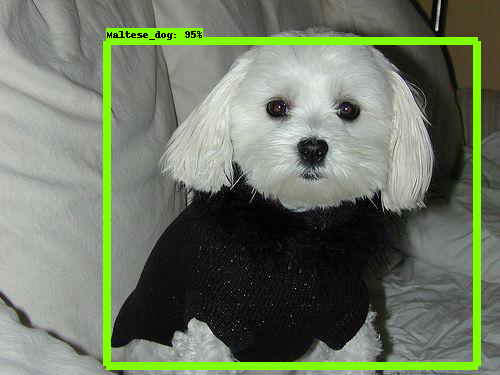

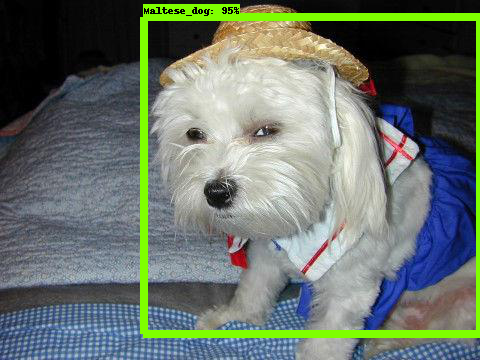

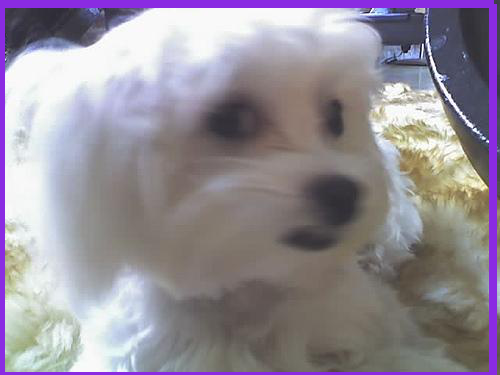

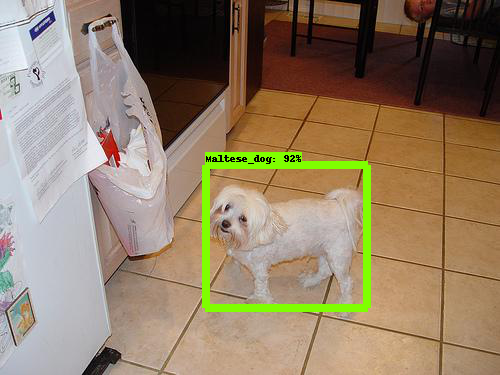

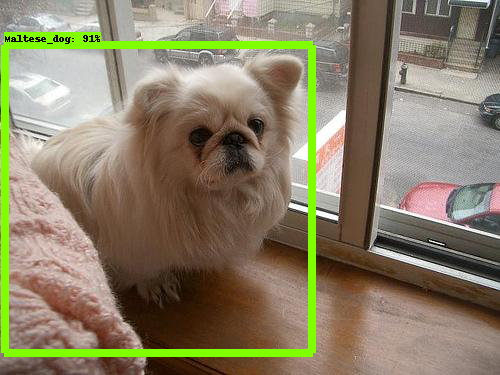

...

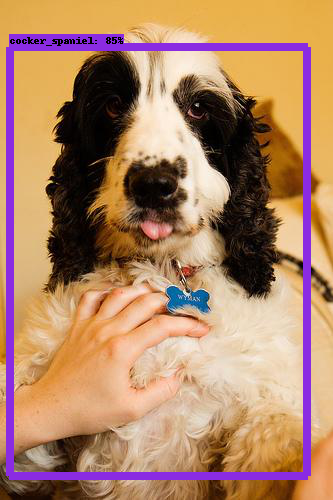

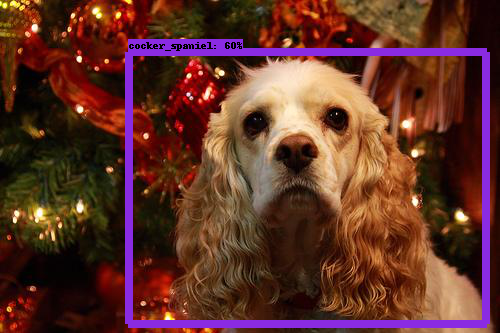

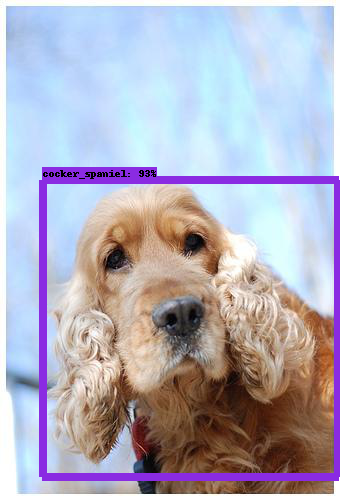

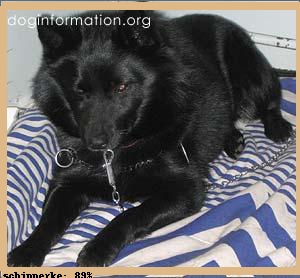

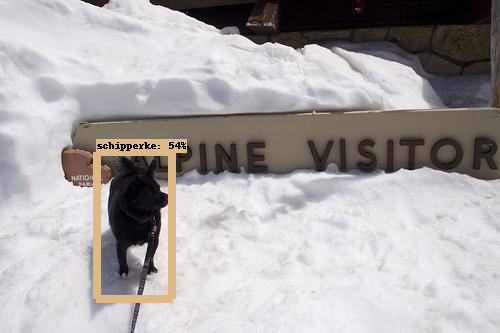

In [11]:
tmp = 0
for file in os.listdir('/content/gdrive/MyDrive/customModel/data/test'):
  if(os.path.splitext(file)[1] != '.xml'):
    if(tmp%10 == 0):
      image_np = load_image_into_numpy_array('/content/gdrive/MyDrive/customModel/data/test/'+file)
      output_dict = run_inference_for_single_image(model, image_np)
      vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          output_dict['detection_boxes'],
          output_dict['detection_classes'],
          output_dict['detection_scores'],
          category_index,
          instance_masks=output_dict.get('detection_masks_reframed', None),
          use_normalized_coordinates=True,
          line_thickness=8)
      display(Image.fromarray(image_np))
    tmp = tmp+1